In [1]:
%load_ext autoreload
%autoreload 2

In [2]:
import sys
sys.path.append("/home/rbusche/projects/incense/")

In [16]:
from incense import FileSystemExperimentLoader
from IPython import display
import matplotlib.pyplot as plt
import numpy as np

In [4]:
RUNS_DIR = "/home/rbusche/runs/"
loader = FileSystemExperimentLoader(RUNS_DIR)

In [5]:
exp = loader.find_by_id(1)
exp

FileSystemExperiment(id=1, name=configs/cohort_17_paper/binning_relu/binning_relu_seed_01)

In [6]:
exp.metrics["test.accuracy"]

step
0       0.520147
1       0.520147
2       0.520147
3       0.520147
4       0.520147
          ...   
9995    0.990232
9996    0.990232
9997    0.990232
9998    0.990232
9999    0.990232
Name: test.accuracy, Length: 100000, dtype: float64

In [53]:
ids = list(range(1, 11))
ids.remove(7)
ids

[1, 2, 3, 4, 5, 6, 8, 9, 10]

## activation function = relu, estimator = mi_estimator.binning

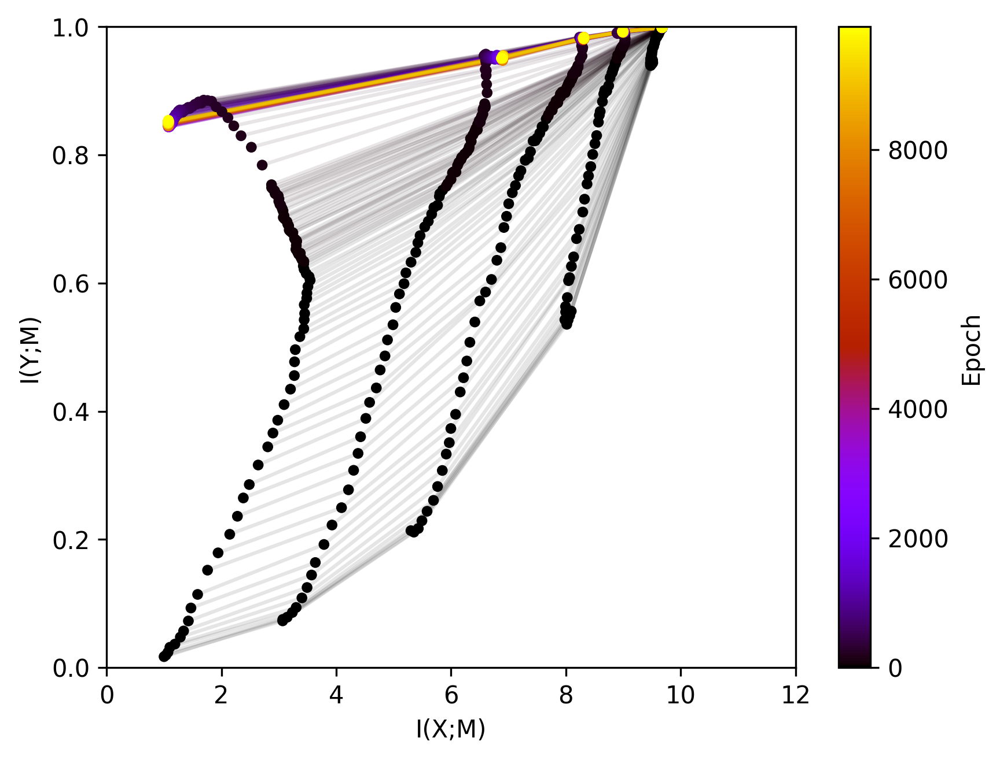

## activation function = elu, estimator = mi_estimator.upper

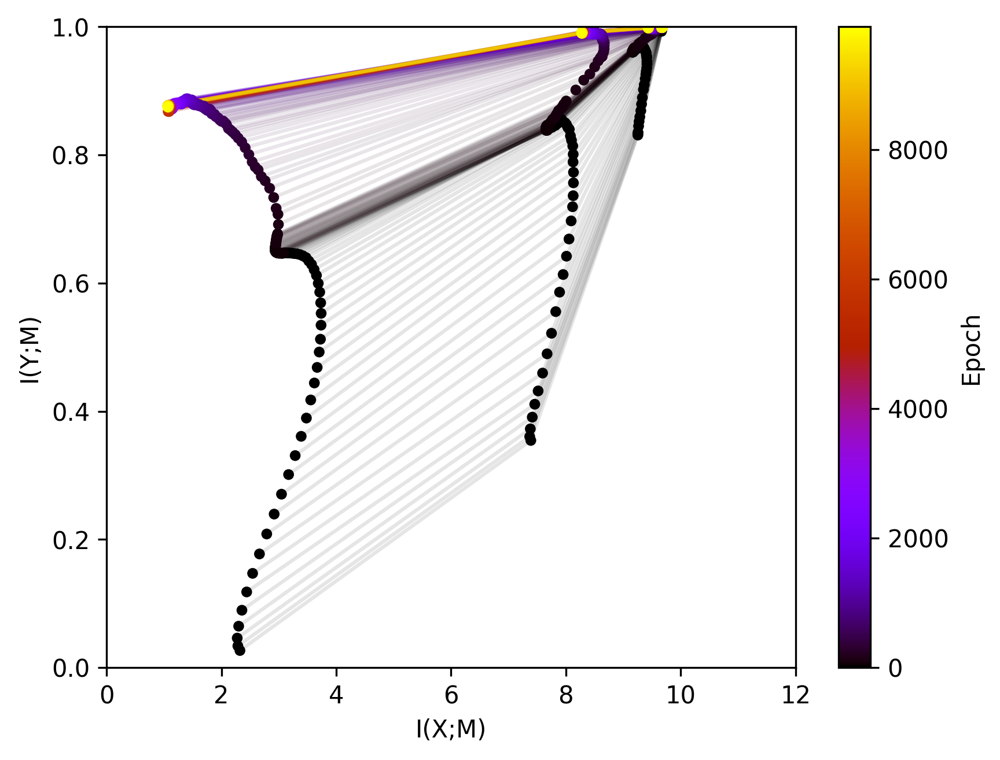

## activation function = relu, estimator = mi_estimator.edge

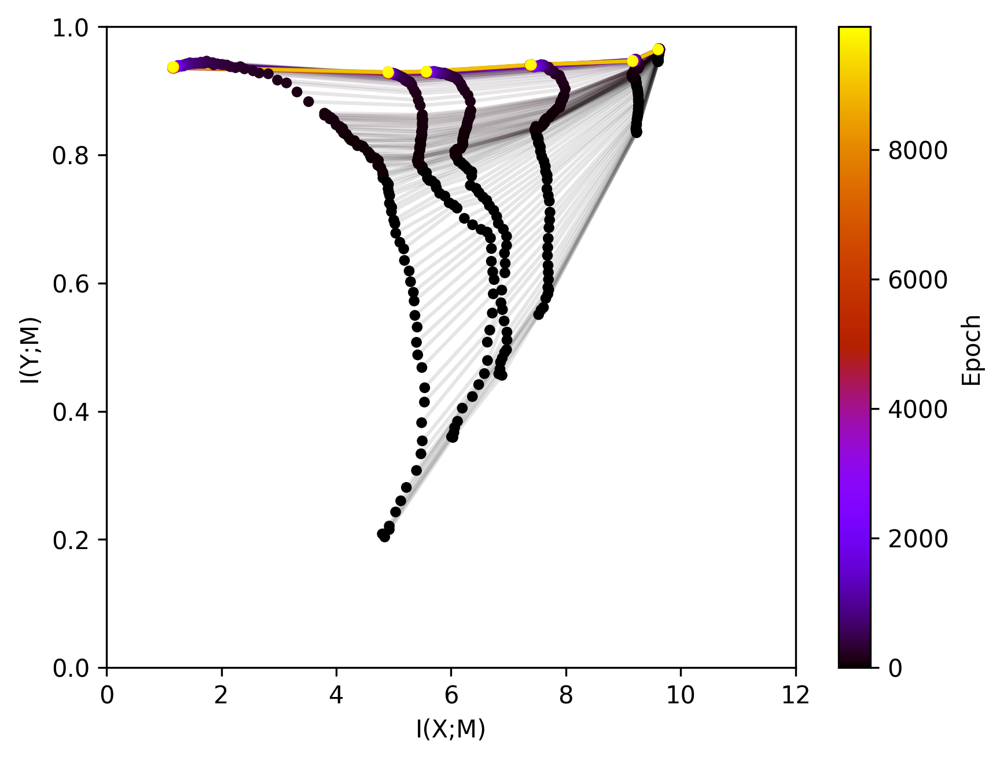

## activation function = relu, estimator = mi_estimator.upper

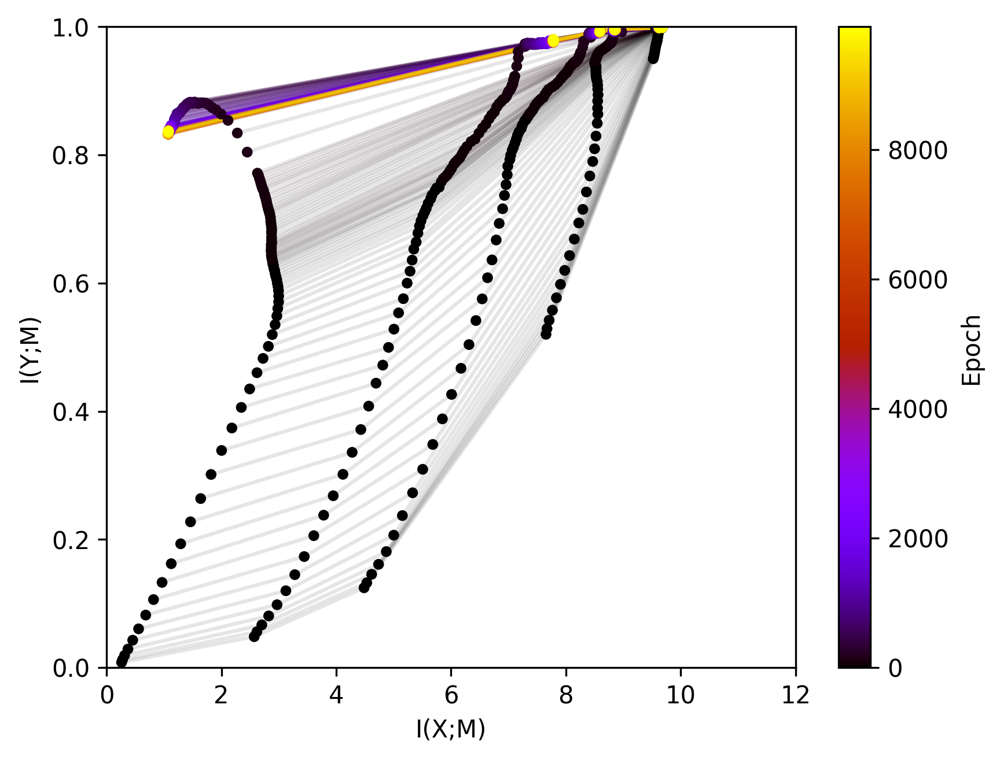

## activation function = tanh, estimator = mi_estimator.edge

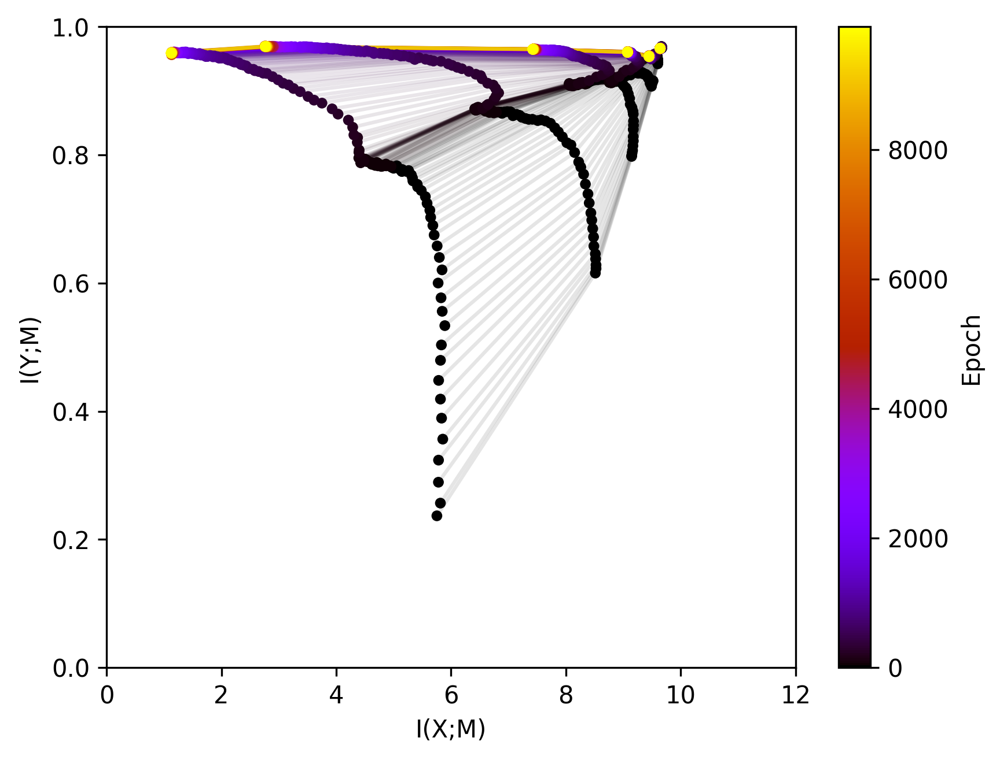

## activation function = elu, estimator = mi_estimator.edge

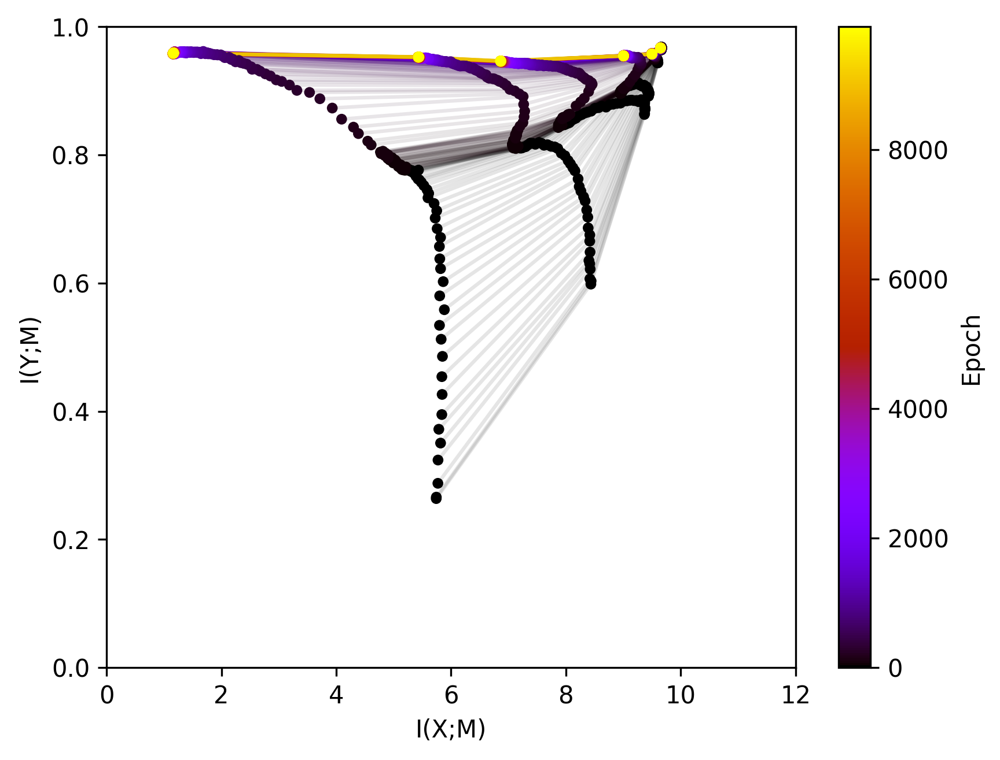

## activation function = elu, estimator = mi_estimator.edge

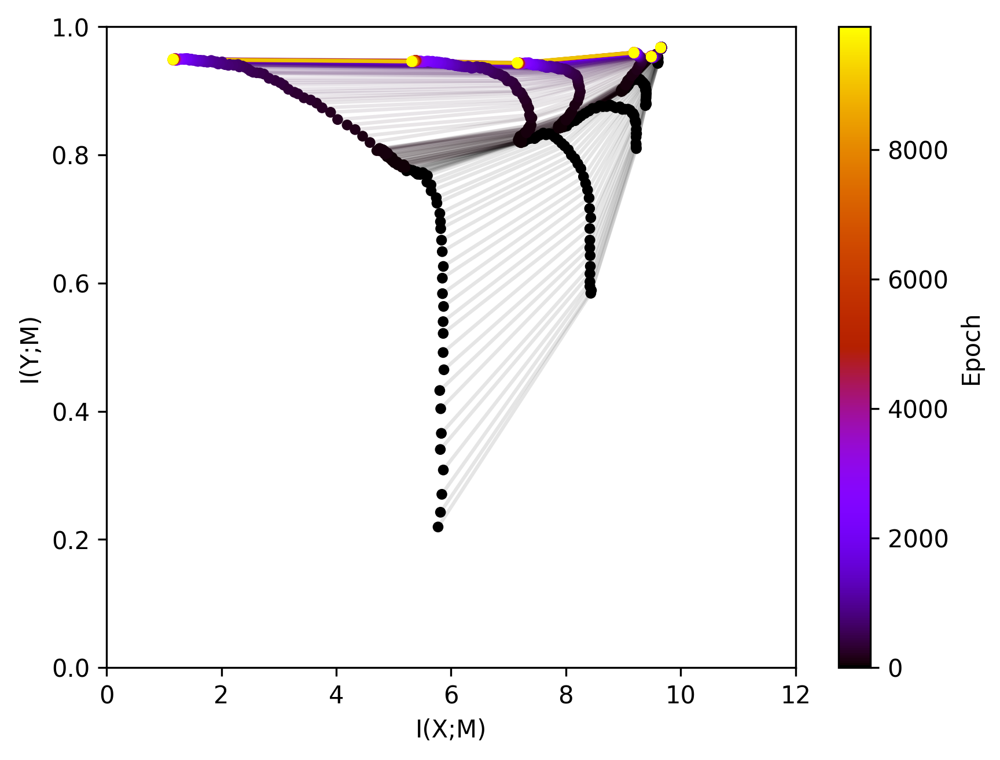

## activation function = elu, estimator = mi_estimator.binning

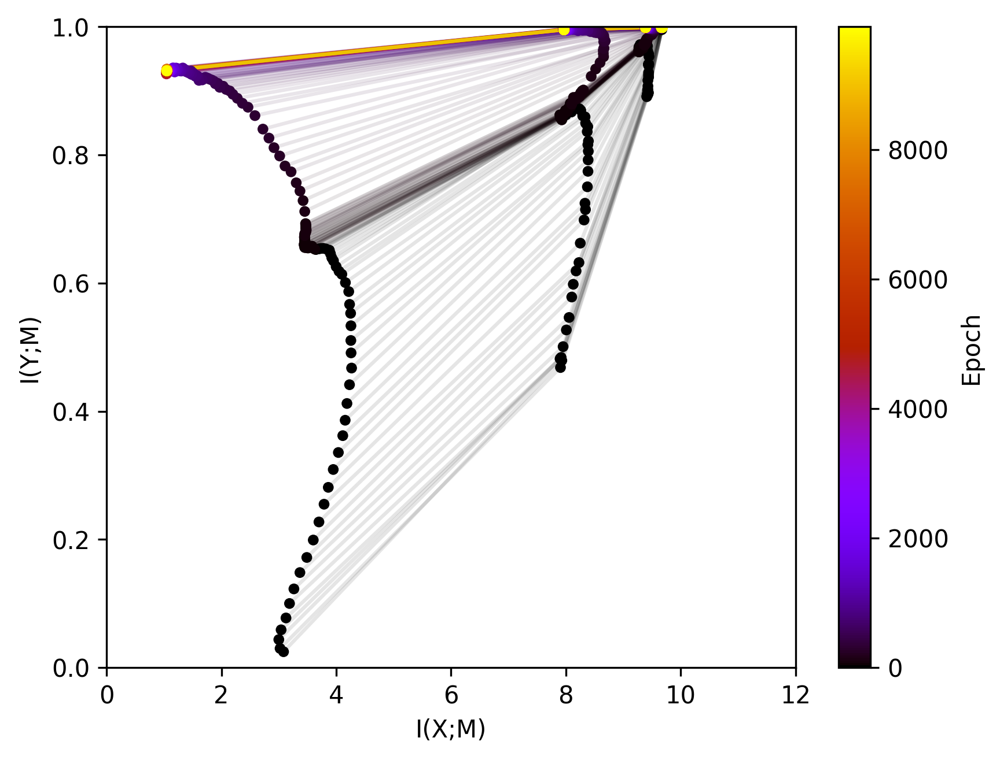

## activation function = tanh, estimator = mi_estimator.binning

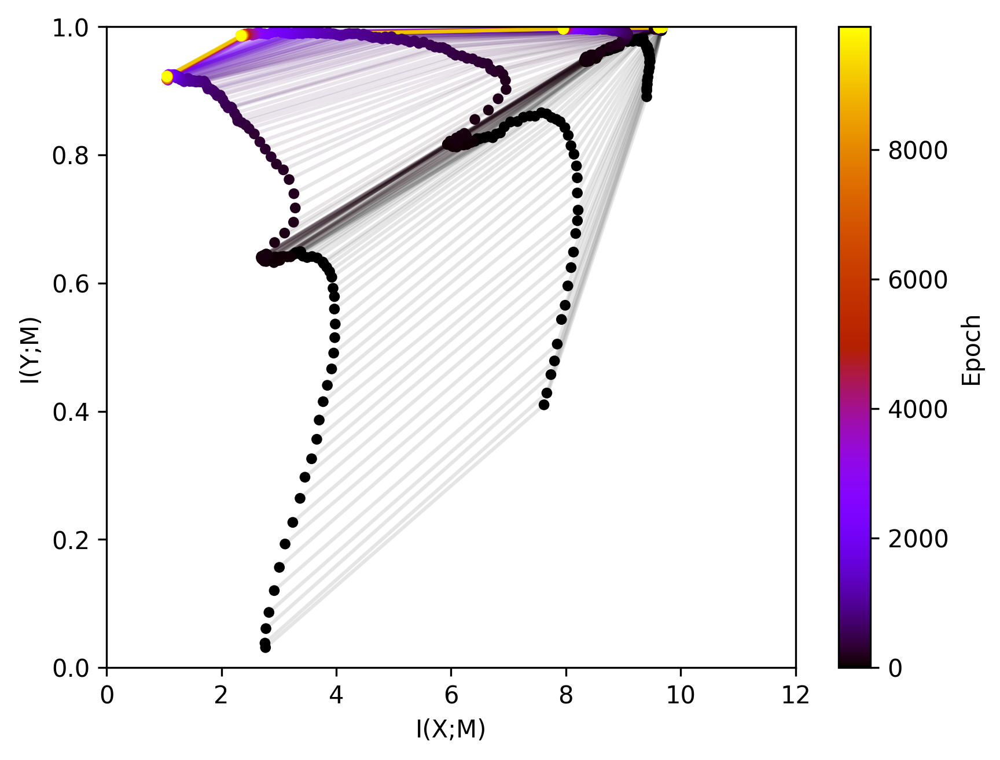

## activation function = tanh, estimator = mi_estimator.upper

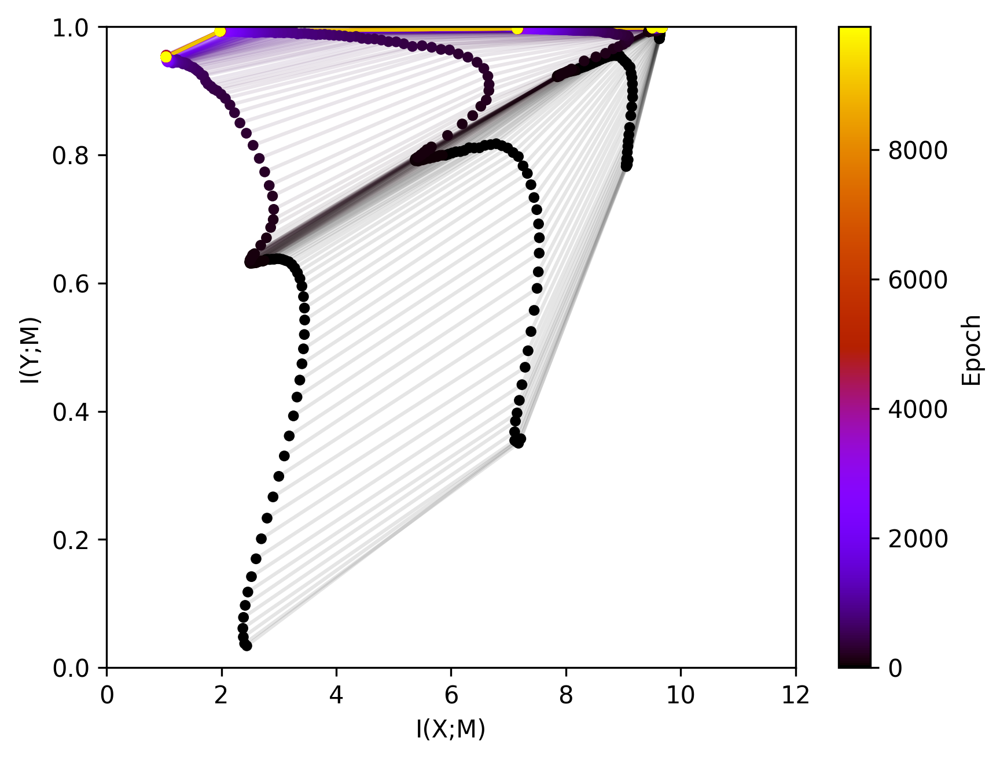

## activation function = tanh, estimator = mi_estimator.upper

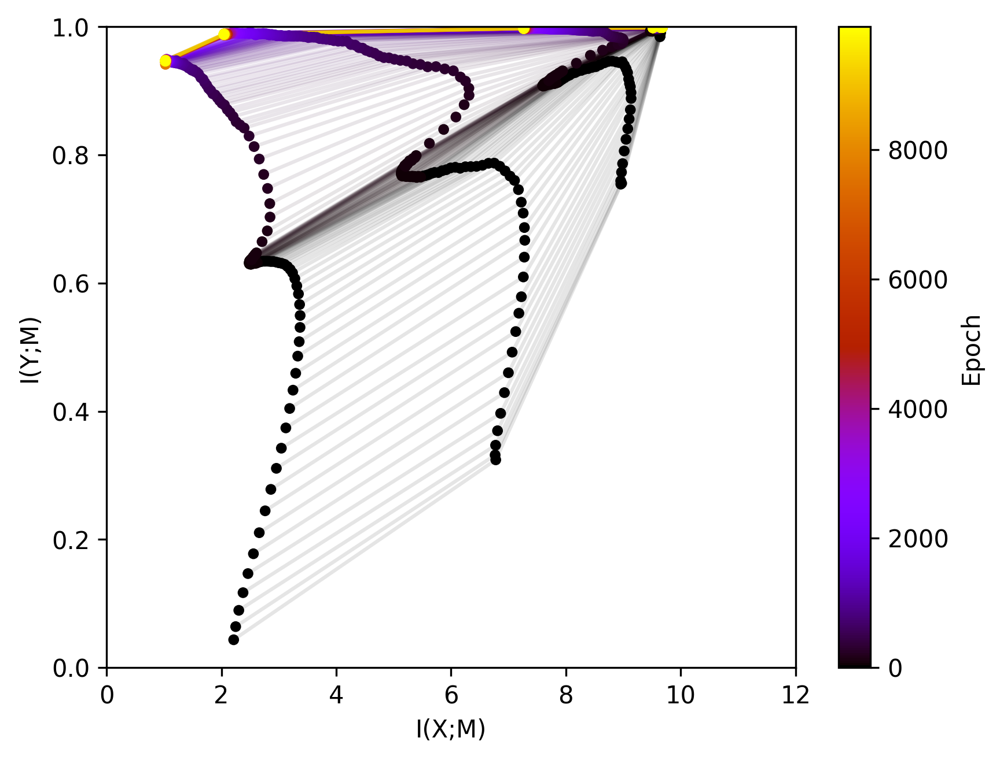

In [15]:
for id_ in ids:
    exp = loader.find_by_id(id_)
    text = f"## activation function = {exp.config.activation_fn}, estimator = {exp.config.estimator}"
    display.display(display.Markdown(text))
    display.display(exp.artifacts["infoplane_test"].as_content_type("image/png").render())

In [7]:
measures_all_runs_test = exp.artifacts["information_measures_test"].as_content_type("text/csv").render()
measures_all_runs_test

,epoch,layer,MI_XM,MI_YM,run
0,0,0,9.677720,0.998828,0
1,0,1,9.384324,0.901935,0
2,0,2,8.087466,0.539027,0
3,0,3,0.901014,0.066205,0
4,0,4,1.059103,0.044895,0
...,...,...,...,...,...
14995,9900,1,9.677720,0.998828,9
14996,9900,2,9.181760,0.996386,9
14997,9900,3,7.803786,0.990703,9
14998,9900,4,5.406952,0.984149,9


In [8]:
measures_summary = {}
measures_summary["mi_mean_over_runs"] = measures_all_runs_test.groupby(
            ["epoch", "layer"]
).mean()


In [9]:
from deep_bottleneck.plotter.informationplane import InformationPlanePlotter 

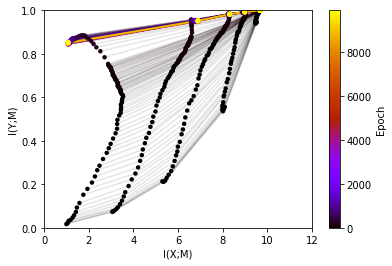

In [10]:
InformationPlanePlotter("", "").plot(measures_summary);

In [26]:
len(ids)

11

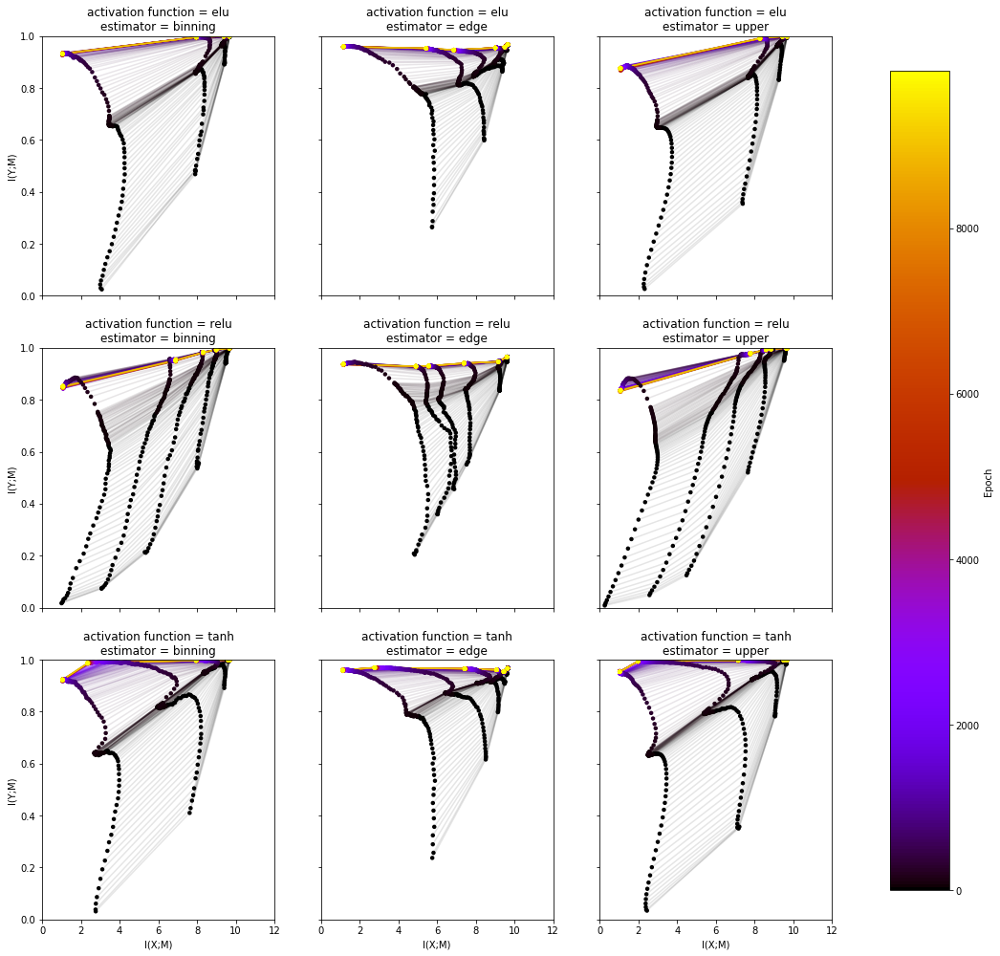

In [64]:
from math import ceil
from itertools import zip_longest
def plot_panel(ids, loader):
    exps = sorted([loader.find_by_id(id_) for id_ in ids], key=lambda exp: (exp.config.activation_fn, exp.config.estimator))
    activation_functions = {exp.config.activation_fn for exp in exps}
    estimators = {exp.config.estimator for exp in exps}

    fig, axes = plt.subplots(nrows=len(activation_functions), ncols=len(estimators), sharex=True, sharey=True, figsize=(17, 17))
    for exp, ax in zip(exps, axes.flat):
        mi_measures = (
            exp.artifacts["information_measures_test"]
            .as_content_type("text/csv")
            .render()
            .set_index(["epoch", "layer"])
            .groupby(["epoch", "layer"])
            .mean()
        )
        sm = infoplane_plot(mi_measures, ax)
        ax.set_title(f"activation function = {exp.config.activation_fn}\nestimator = {exp.config.estimator.split('.')[-1]}")
        
    for ax in axes[:, 0]:
        ax.set(ylabel='I(Y;M)')

    for ax in axes[-1, :]:
        ax.set(xlabel='I(X;M)')

    
    fig.subplots_adjust(right=0.8)
    cbar_ax = fig.add_axes([0.85, 0.15, 0.05, 0.7])

    fig.colorbar(sm, label='Epoch', cax=cbar_ax)
    #fig.tight_layout()

    return fig
    
def infoplane_plot(measures, ax):
    total_epochs = measures.index.get_level_values('epoch')[-1] + 1  # epoch index starts at 0
    sm = plt.cm.ScalarMappable(cmap='gnuplot', norm=plt.Normalize(vmin=0, vmax=total_epochs))
    sm.set_array([])
    for epoch, mi_measures in measures.groupby(level=0):
        color = sm.to_rgba(epoch)

        xmvals = np.array(mi_measures['MI_XM'])
        ymvals = np.array(mi_measures['MI_YM'])

        ax.plot(xmvals, ymvals, color=color, alpha=0.1, zorder=1)
        ax.scatter(xmvals, ymvals, s=20, facecolors=color, edgecolor='none', zorder=2)
        ax.set(xlim=[0, 12], ylim=[0, 1])
    return sm

fig = plot_panel(ids, loader);
fig.savefig("results.png")

In [52]:
for id_ in ids:
    exp = loader.find_by_id(id_)
    if exp.config.activation_fn == "tanh" and exp.config.estimator.endswith("upper"):
        print(id_)

10
11


In [48]:
exp6 = loader.find_by_id(6)
exp6.start_time 

'2020-02-26T20:39:39.009270'

In [49]:
exp6 = loader.find_by_id(7)
exp6.start_time 

'2020-02-26T20:39:39.016981'